# PW 1 - Markovian models (Victor Piriou & Nathan Galmiche) 

Session 2022

Sampling of Markovian models.

The aim of this session is to program the Gibbs sampler algorithm and study it in the binary case.

You have to fill by hand-writing the printed version of the practical work and upload the filled jupyter notebook on e-campus.

In this section we consider a binary Markov random field (taking values in $E=\{0,1\}$). 
The neighborhood is defined in 4-connexity and the potential of a clique of order 2 is defined by :
$V_c(0,1)=V_c(1,0)=+\beta$ and $V_c(1,1)=V_c(0,0)=0$ (the potential for singleton clique is 0).


In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

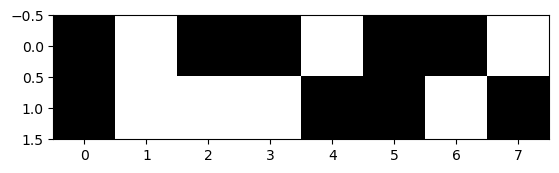

In [2]:
plt.set_cmap("gray")

sh = [2, 8]

imaU = np.random.choice([0, 1], size=sh)
plt.imshow(imaU)

#Q1 
For the Ising model defined above, and the imaU generated in the previous cell, give the formula of the global energy and give its value as a function of $\beta$ for imaU.



#A1 
(the answer should be written manually on your paper report) 

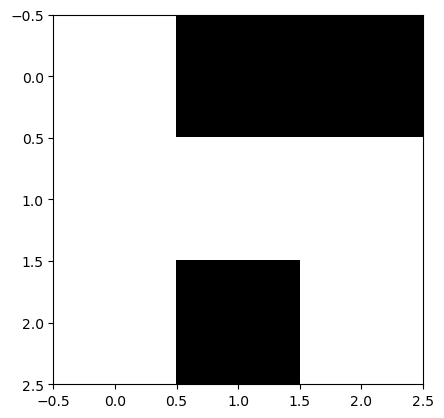

In [3]:
sh = [3, 3]

imaVois = np.random.choice([0, 1], size=sh)
plt.imshow(imaVois)

#Q2 

Write the general form of the local conditional probability in a pixel $s$. For the neighborhood configuration imaVois generated by the previous code cell, compute the 2 local conditional energies (for the value 0 and for the value 1 of the central pixel), then the local conditional probabilities (as a function of $\beta$). What is the most probable class ? (NB: do the calculation for an 8-neighborhood).



#A2
(the answer should be written manually on your paper report) 


## Part 1

Programming the Gibbs sampler and drawing samples of Markovian models 



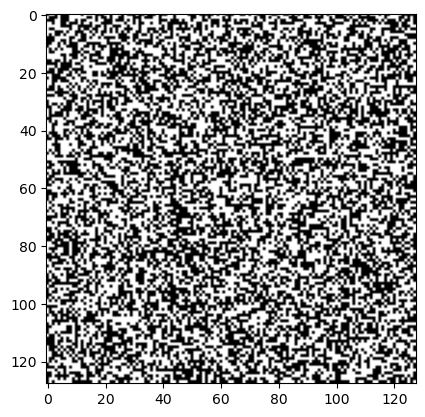

In [4]:
plt.set_cmap("gray")

sh = [128, 128]

im_bin = np.random.choice([0, 1], size=sh)
plt.imshow(im_bin)

### Sampling function
Complete the following function which takes as input a binary image (which will be updated by Gibbs sampling) and the value of the regularization parameter.


In [5]:
def echan(im_bin, beta_reg):
    rows, cols = im_bin.shape

    for i in range(rows):
        for j in range(cols):
            # do not change these indices 
            # they allow access to neighboring pixels  
            # i1,j and i2,j and i,j1 and i,j2
            i1, i2 = (i - 1) % rows, (i + 1) % rows
            j1, j2 = (j - 1) % cols, (j + 1) % cols

            # complete the calculation of energies and associated probabilities 
            # energy and non-normalized proba when the pixel is put in class 0
            neighbors = [im_bin[i, j1], im_bin[i, j2], im_bin[i2, j], im_bin[i1, j]]
            Ureg0 = beta_reg * sum(neighbors)
            p0 = math.exp(-Ureg0)

            # energy and non-normalized proba when the pixel is put in class 1
            Ureg1 = beta_reg * (4 - sum(neighbors))
            p1 = math.exp(-Ureg1)

            # sampling according to the normalized probabilities. NB: the normalization is done here
            im_bin[i, j] = random.uniform(0, 1) >= p0 / (p0 + p1)

    return im_bin

 
By varying the value of the regularization parameter and restarting the cell, observe. You can remove the visualization during sampling and increase the number of iterations

<Figure size 640x480 with 0 Axes>

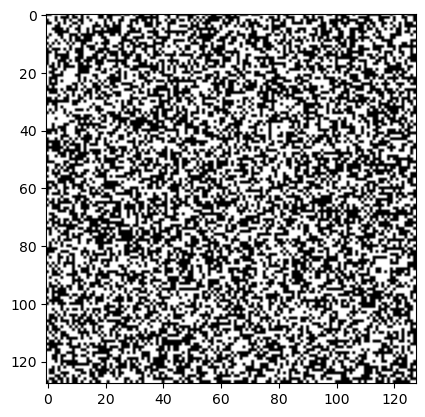

Beta = -0.5


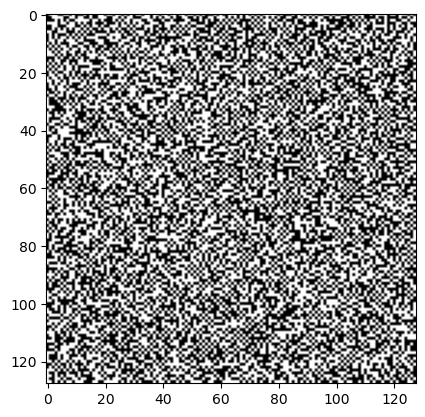

Beta = -1.8928571428571428


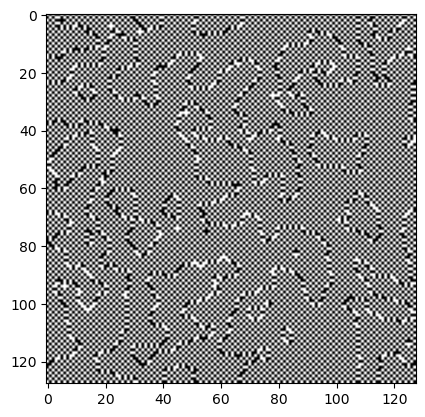

Beta = -3.2857142857142856


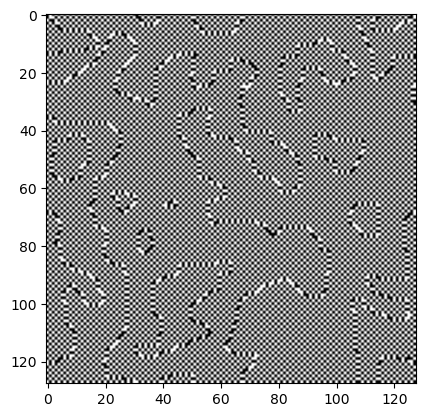

Beta = -4.678571428571429


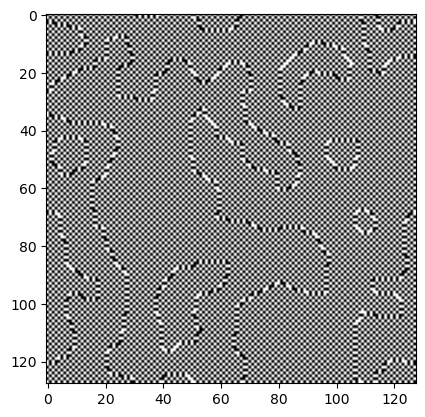

Beta = -6.071428571428571


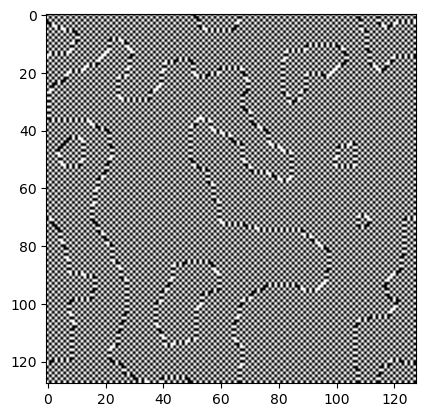

Beta = -7.4642857142857135


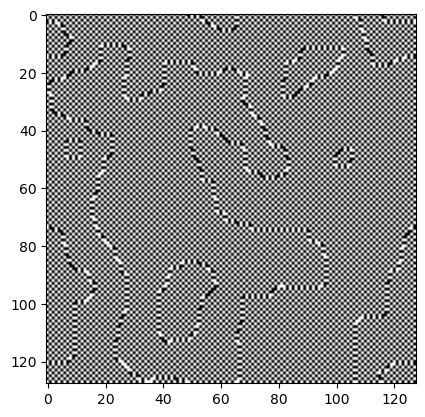

Beta = -8.857142857142858


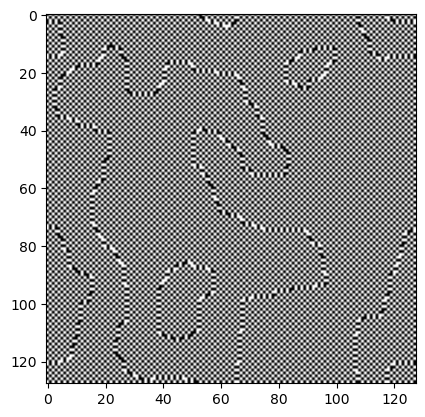

Beta = -10.25


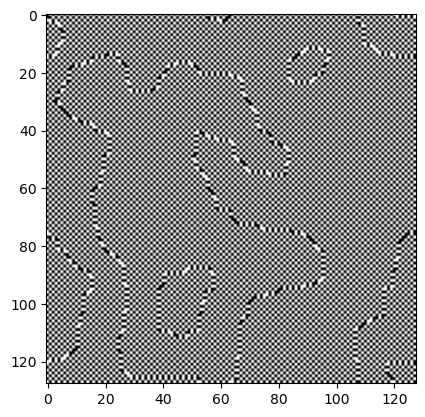

Beta = -11.642857142857142


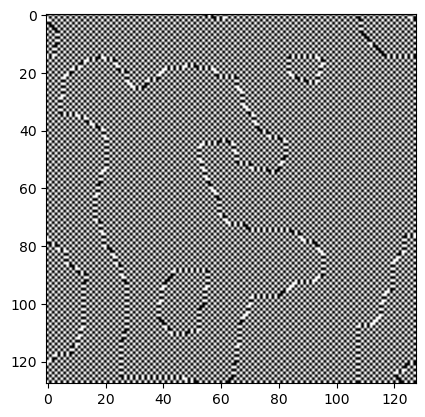

Beta = -13.035714285714285


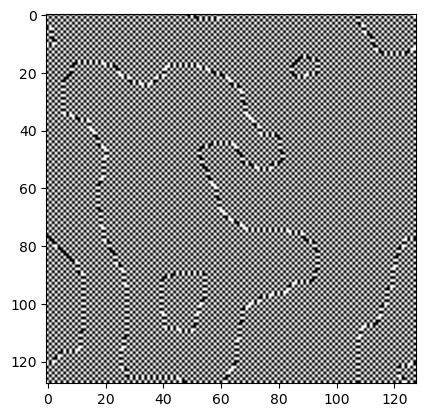

Beta = -14.428571428571427


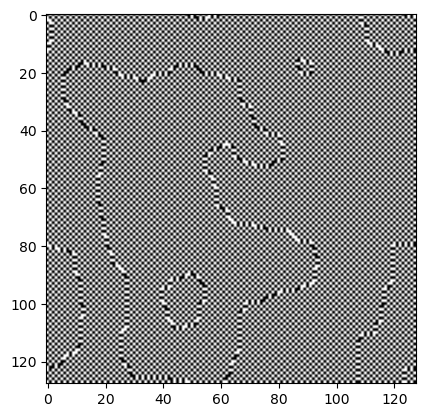

Beta = -15.821428571428571


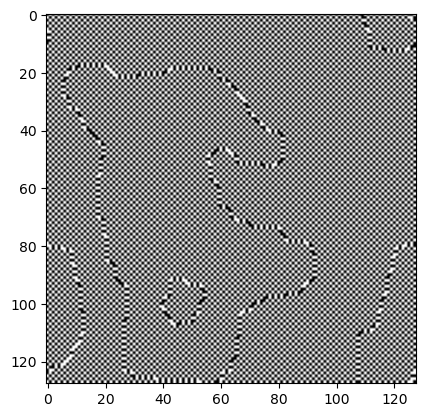

Beta = -17.214285714285715


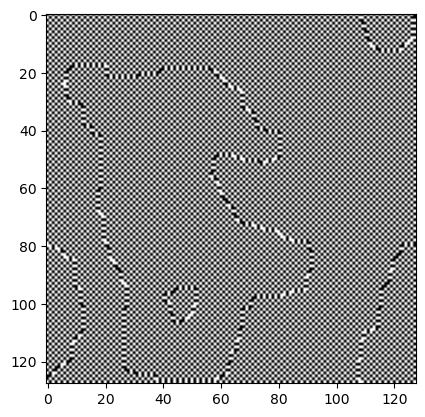

Beta = -18.607142857142858


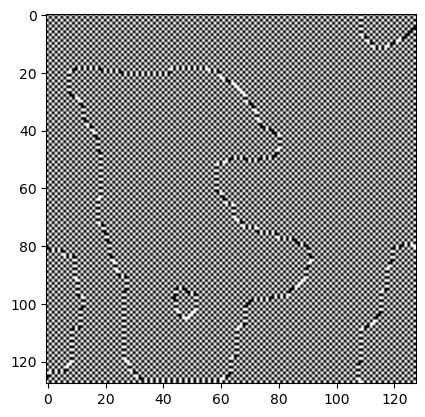

Beta = -20.0


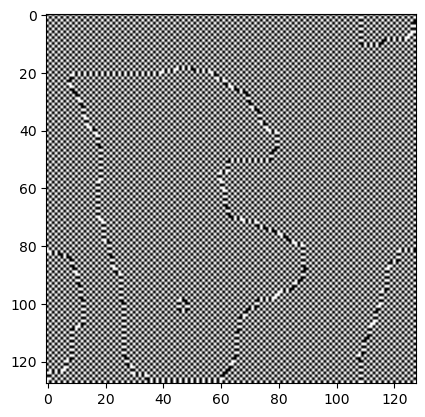

In [8]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin = np.random.choice([0, 1], size=sh)

# initializing beta values
beta_reg=np.linspace(-0.5, -20, num=15)

mafigure=plt.figure()
plt.imshow(im_bin);        
mafigure.canvas.draw()
plt.show()

# test each value of beta
for beta in beta_reg:
    for n in range(10):
        im = im_bin
        echan(im,beta) 
        plt.imshow(im)      
        mafigure.canvas.draw()
    print("Beta =",beta)
    plt.show(block=False)

#Q3
Run the program several times. Do you still get the same image? Comment on this.

#A3
(the answer should be written manually on your paper report) 


#Q4

Vary $\beta$ from 0.5 to 20. Comment on the results. 

#A4
(the answer should be written manually on your paper report) 


#Q5 
Which image minimizes the overall energy for this model? 

#A5
(the answer should be written manually on your paper report) 



#Q6
Change 𝛽 and give it a negative value. Describe the result and justify it.

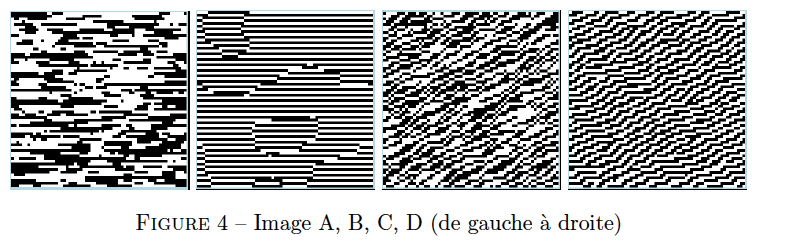

#Q7 
We now work in 8-neighborhood, but still with cliques of order 2 (non-isotropic this time). For each of the following images, propose the clique potentials that allow us to obtain these realizations. Initially all clique potentials are zero. 


* Image A : there is only one clique potential of order 2 which is -1.
* Image B : in addition to the previous one, there is a clique potential of order 2 which is 1. Indicate which one.
* Image C: in addition to the 2 previous ones, there is a clique potential of order 2 which is -1. Indicate which one.
* Image D: in addition to the 3 previous ones, there is a second order clique potential which is +1. Indicate which one.


Modify your program to obtain these results 
(you can copy and paste the previous cells). 


<Figure size 640x480 with 0 Axes>

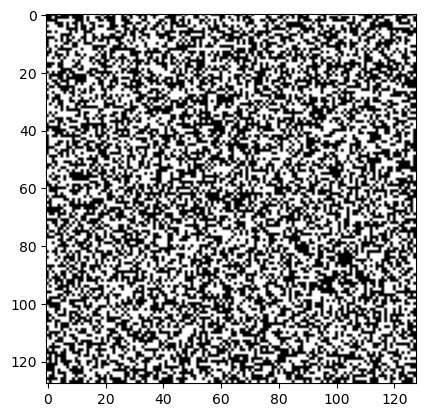

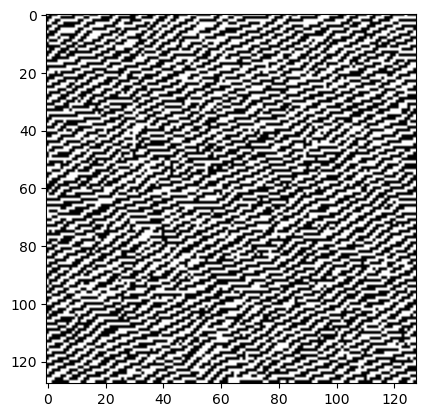

In [10]:
def echan(im_bin,beta_reg):
    rows, cols = im_bin.shape

    for i in range(rows):
        for j in range(cols):
          # do not change these indices 
          # they allow access to neighboring pixels  
          # i1,j and i2,j and i,j1 and i,j2
            i1, i2 = (i - 1) % rows, (i + 1) % rows
            j1, j2 = (j - 1) % cols, (j + 1) % cols

        # complete the calculation of energies and associated probabilities 
        # energy and non-normalized proba when the pixel is put in class 0
            # 1st term in the parenthesis is for image A
            # 1st & 2nd terms in the parenthesis are for image B
            # 1st & 2nd & 3rd terms in the parenthesis are for image C
            # all terms are for image D
        
            Ureg0 = (
                beta_reg * (1 - im_bin[i, j1] + 1 - im_bin[i, j2])
                + 1 - im_bin[i1, j]
                + 1 - im_bin[i2, j]
                - (1 - im_bin[i1, j2] + 1 - im_bin[i2, j1])
                + 1 - im_bin[i1, j1]
                + 1 - im_bin[i2, j2]
            )
            p0 = math.exp(-Ureg0)

        # energy and non-normalized proba when the pixel is put in class 1
            # 1st term in the parenthesis is for image A
            # 1st & 2nd terms in the parenthesis are for image B
            # 1st & 2nd & 3rd terms in the parenthesis are for image C
            # all terms are for image D
            Ureg1 = (
                beta_reg * (im_bin[i, j1] + im_bin[i, j2])
                + 1 * (im_bin[i1, j] + im_bin[i2, j])
                + (-1) * (im_bin[i1, j2] + im_bin[i2, j1])
                + 1 * (im_bin[i1, j1] + im_bin[i2, j2])
            )
            p1 = math.exp(-Ureg1)

        # sampling according to the normalized probabilities. NB: the normalization is done here
            im_bin[i, j] = random.uniform(0, 1) >= p0 / (p0 + p1)

    return im_bin

plt.set_cmap('gray')
sh=[128,128]
im_bin = np.random.choice([0, 1], size=sh)

beta_reg=-1

mafigure=plt.figure()
plt.imshow(im_bin);        
mafigure.canvas.draw()
plt.show()

for n in range(20):
    echan(im_bin,beta_reg) 
    plt.imshow(im_bin)      
    mafigure.canvas.draw()
plt.show(block=False)

#A7
(the answer should be written manually on your paper report) 


#Q8

Modify your program to define an Ising model with  diagonal attractive potentials only (the other potentials are zero). Comment on the result. 

<Figure size 640x480 with 0 Axes>

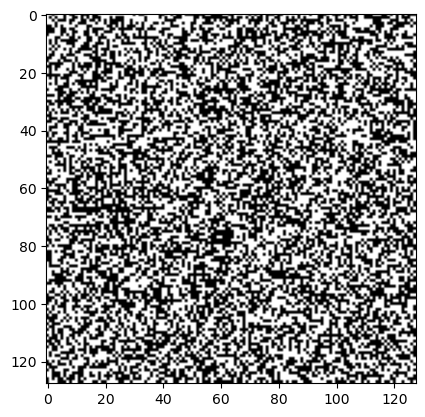

Beta = 0.5


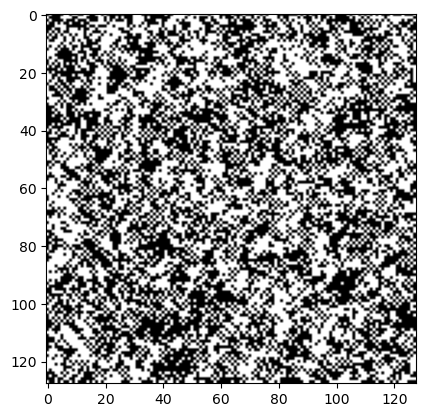

Beta = 7.607142857142857


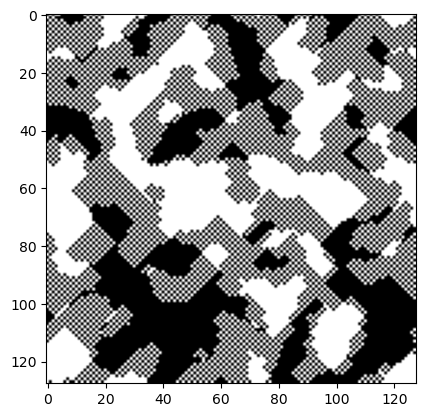

Beta = 14.714285714285714


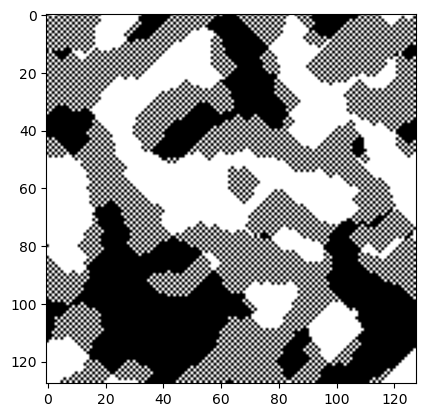

Beta = 21.82142857142857


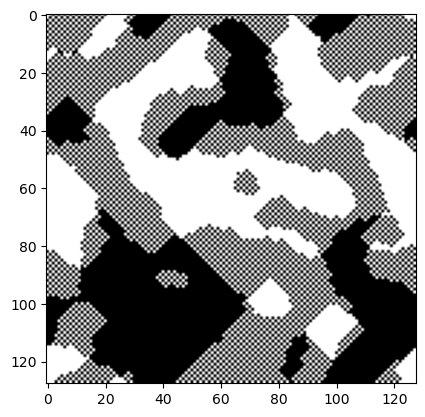

Beta = 28.928571428571427


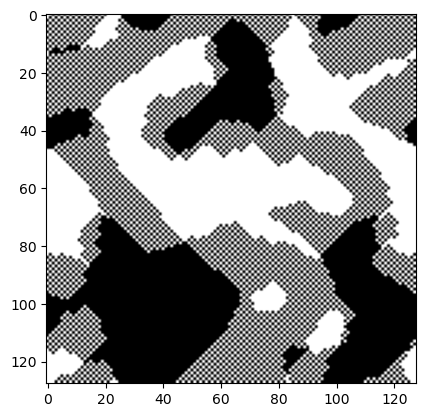

Beta = 36.035714285714285


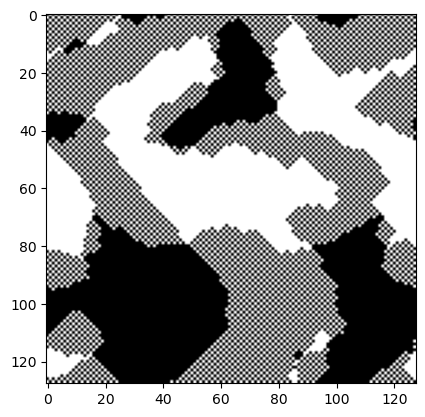

Beta = 43.14285714285714


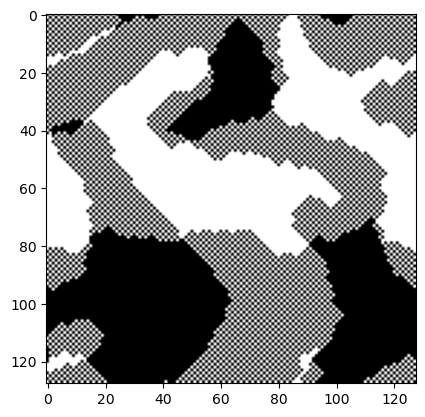

Beta = 50.25


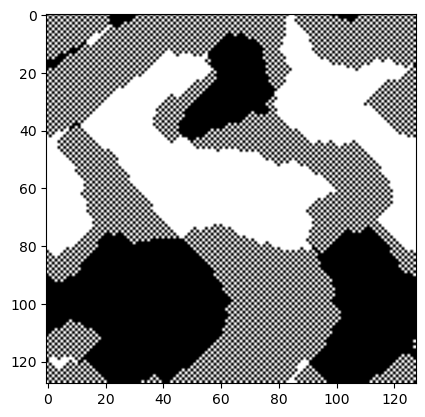

Beta = 57.357142857142854


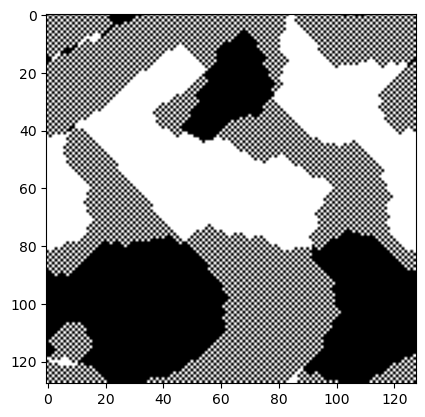

Beta = 64.46428571428571


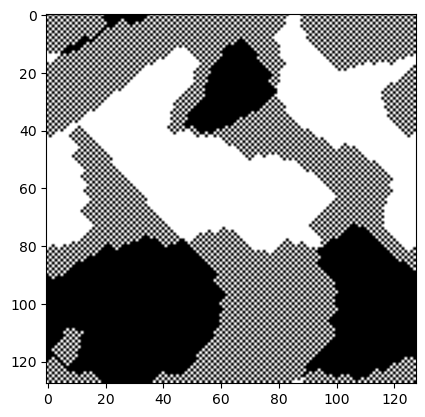

Beta = 71.57142857142857


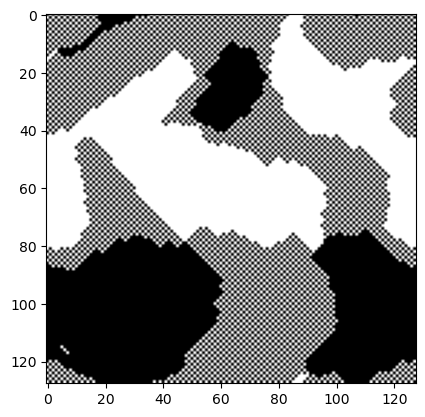

Beta = 78.67857142857143


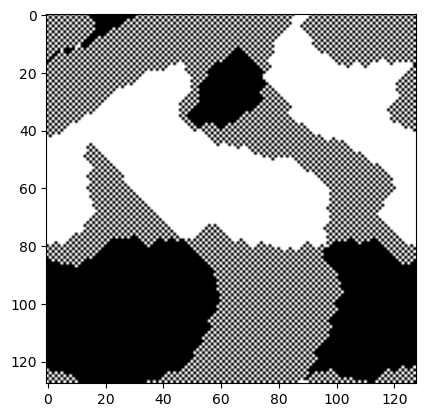

Beta = 85.78571428571428


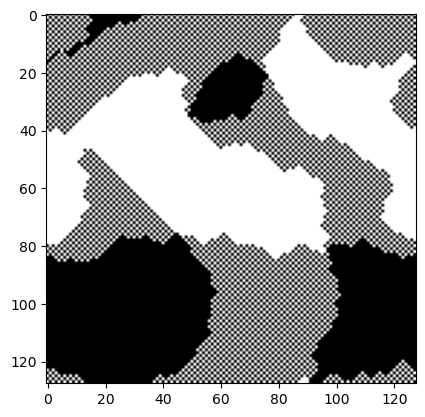

Beta = 92.89285714285714


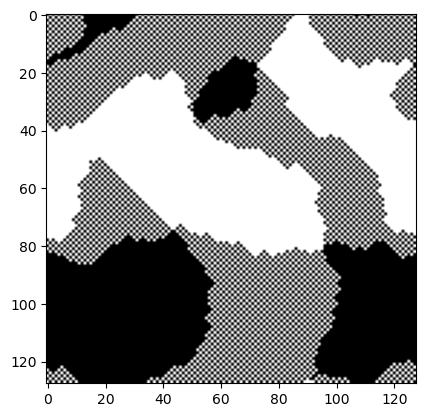

Beta = 100.0


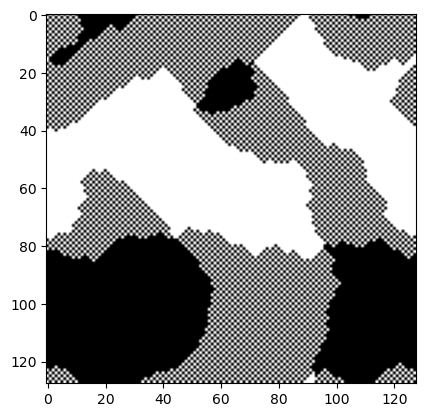

In [16]:
def echan(im_bin,beta_reg):
    rows, cols = im_bin.shape

    for i in range(rows):
        for j in range(cols):
          # do not change these indices 
          # they allow access to neighboring pixels  
          # i1,j and i2,j and i,j1 and i,j2
            i1, i2 = (i - 1) % rows, (i + 1) % rows
            j1, j2 = (j - 1) % cols, (j + 1) % cols

            neighbors = [im_bin[i1, j1], im_bin[i1, j2], im_bin[i2, j1], im_bin[i2, j2]]

        # complete the calculation of energies and associated probabilities 
        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0 = beta_reg * sum(n for n in neighbors)
            p0 = math.exp(-Ureg0)

        # energy and non-normalized proba when the pixel is put in class 1
            Ureg1 = beta_reg * sum(1 - n for n in neighbors)
            p1 = math.exp(-Ureg1)

        # sampling according to the normalized probabilities. NB: the normalization is done here
            im_bin[i, j] = random.uniform(0, 1) >= p0 / (p0+p1)

    return im_bin

plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))

# Initializing beta values
beta_reg=np.linspace(0.5, 100, num=15)

mafigure=plt.figure()
plt.imshow(im_bin);        
mafigure.canvas.draw()
plt.show()

# Test each value of beta
for beta in beta_reg:
    for n in range(10):
        im = im_bin
        echan(im,beta)      
        plt.imshow(im_bin)
        mafigure.canvas.draw()
    print(f"Beta = {beta}") 
    plt.show(block=False)

#A8
(the answer should be written manually on your paper report) 
